<a href="https://colab.research.google.com/github/wagnerde/ISCC_Shivdasani/blob/main/ISCC_Shivdasani2022_analysis_220614_sample3_WholeMes_Col.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ISCC Shivdasani 2022: Analysis
Analyze cNMF spectra calculated for: <br>
**sample3-WholeMes_Col** <br>


## Environment Setup (220614)
Install software from pip, apt, and Github.  Load modules, configure workspace settings.

In [ ]:
# Environment Setup: verified working on 220614

# print python version to screen
!python --version

# pip install software
!pip install -q scanpy==1.8.2 bbknn==1.5.1 leidenalg==0.8.10 scrublet==0.2.3 wget==3.2 
!pip install -q pyyaml==5.3.1 fastcluster==1.1.26 cnmf==1.3.2

# apt-get install software
!sudo apt-get install -qq lftp

# import python packages
import os, sys, wget, pickle
import bbknn
import scrublet as scr
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# import helper functions from Github
if not os.path.exists('scTools-py'): 
  !git clone https://github.com/wagnerde/scTools-py.git
sys.path.append('scTools-py/')
import scTools_dew as dew

Python 3.7.13
     |████████████████████████████████| 2.0 MB 5.0 MB/s 
     |████████████████████████████████| 1.3 MB 41.8 MB/s 
     |████████████████████████████████| 96 kB 4.4 MB/s 
     |████████████████████████████████| 88 kB 4.3 MB/s 
     |████████████████████████████████| 646 kB 19.4 MB/s 
     |████████████████████████████████| 1.1 MB 56.0 MB/s 
     |████████████████████████████████| 3.1 MB 40.1 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 
     |████████████████████████████████| 269 kB 5.1 MB/s 
     |████████████████████████████████| 155 kB 58.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 2.)
debconf: falling back to frontend: Readline
debconf: unable to initialize 

## Download Preprocessed Data from Box

In [ ]:
# wget files from static Box link 
!wget -q --show-progress https://ucsf.box.com/shared/static/qqqvqhn66u3p1gosqm5dd9inpx8gogst.h5ad -O Shiv2022_WholeMes_Col_raw.220624.h5ad
!wget -q --show-progress https://ucsf.box.com/shared/static/h4zwmfm47h95pnrjuirvqegw3xfnuvhn.gz -O Shiv2022_WholeMes_Col.220624.cNMF.tar.gz
!tar -xzf Shiv2022_WholeMes_Col.220624.cNMF.tar.gz

# move cNMF output back to its "normal" location
!mv /content/content/cNMF-output/ /content/

Shiv2022_WholeMes_C 100%[===================>] 164.18M  52.6MB/s    in 3.4s    
Shiv2022_WholeMes_C 100%[===================>] 410.68M  17.3MB/s    in 23s     


## Run ScanPy

### Read in the dataset


In [ ]:
adata = sc.read('Shiv2022_WholeMes_Col_raw.220624.h5ad')

### Process and Normalize

In [ ]:
adata.layers['raw_nolog'] = adata.X.copy()
adata.layers['raw'] = np.log1p(adata.X.copy())
sc.pp.filter_cells(adata, min_genes=250)
sc.pp.normalize_total(adata, target_sum=1e6, inplace=True) # TPM Normalization
adata.layers['tpm_nolog'] = adata.X.copy()
sc.pp.log1p(adata)
adata.layers['tpm'] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
sc.pp.scale(adata)

### Compute Embeddings and Perform Clustering

In [ ]:
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=50, n_pcs=50)
sc.tl.umap(adata)

In [ ]:
sc.tl.leiden(adata, resolution=0.1) # default resolution = 1

### Plot Embeddings

In [ ]:
sc.set_figure_params(dpi=120, figsize=[4,4], dpi_save=300, fontsize=10)
!mkdir -p figures/
sample_name_prefix = '220316-s3-WholeMesCol'

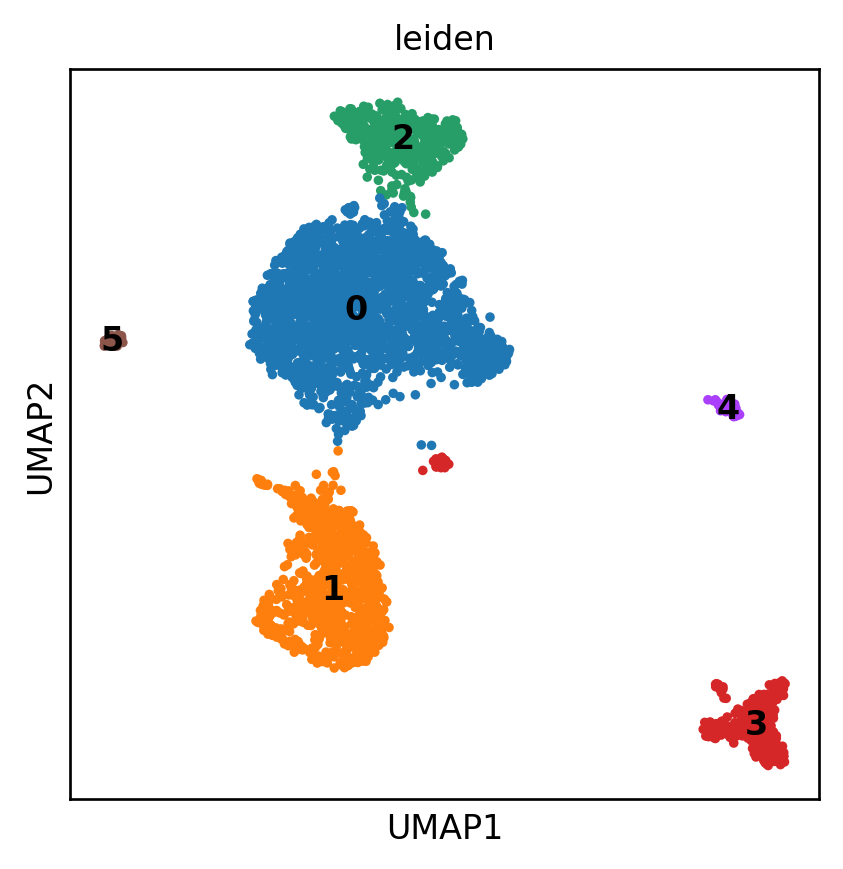

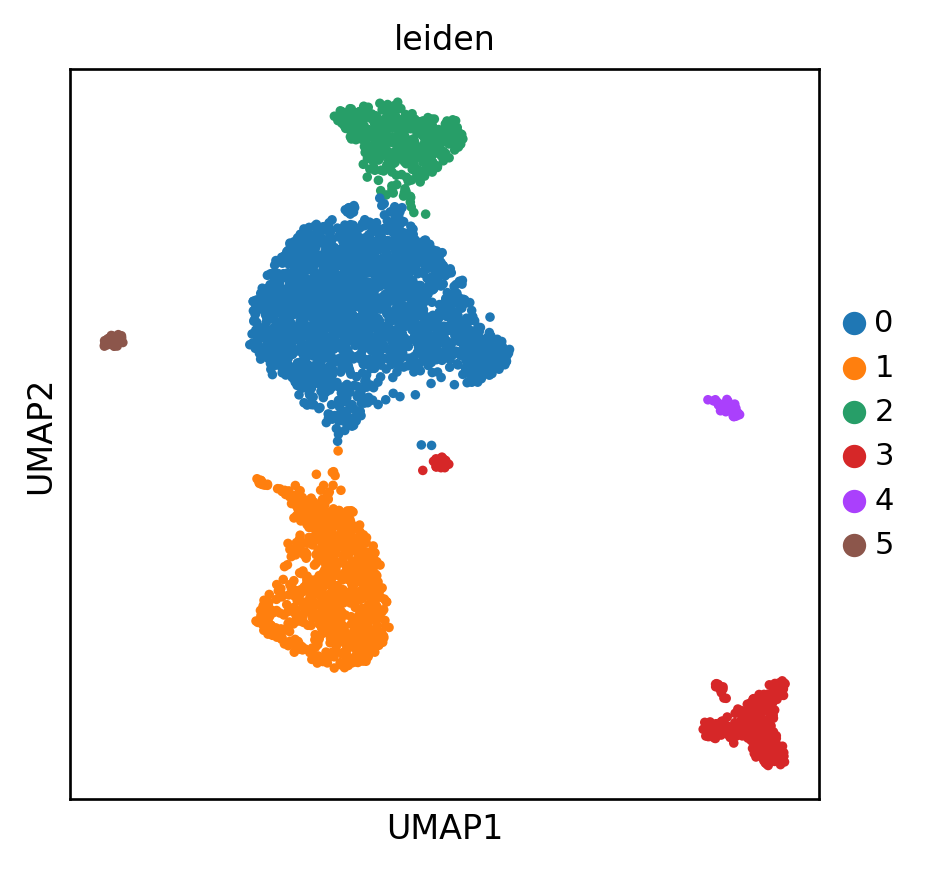

In [ ]:
# Inspect the UMAP plot - overlay with the results of the leiden clustering algorithm
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', save='_'+sample_name_prefix+'.leiden.pdf')
sc.pl.umap(adata, color=['leiden'], save='_'+sample_name_prefix+'.leiden.legend.pdf')

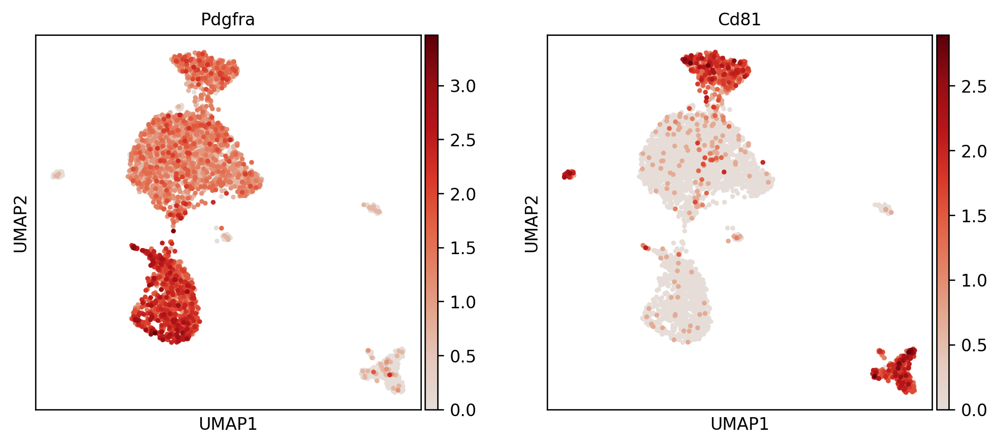

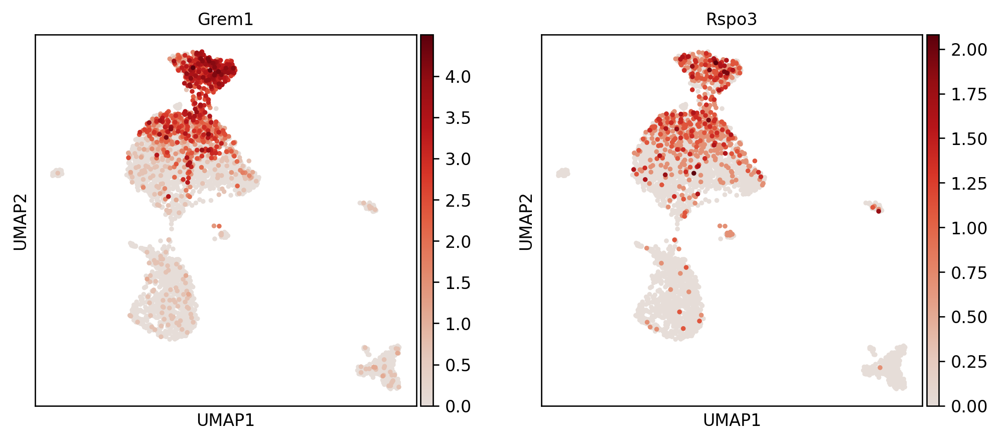

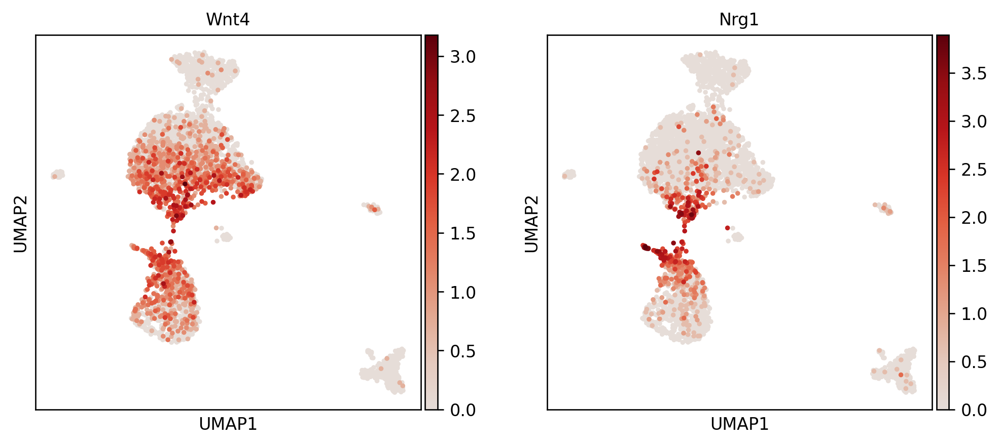

In [ ]:
# Overlay with a few marker genes
sc.pl.umap(adata, color=['Pdgfra','Cd81'], layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))
sc.pl.umap(adata, color=['Grem1','Rspo3'], layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))
sc.pl.umap(adata, color=['Wnt4','Nrg1'], layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))

### Identify Differentially Expressed Genes

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', use_raw=False, layer='raw', reference='rest', n_genes=100, method='wilcoxon', 
                        corr_method='benjamini-hochberg', log_transformed=True, key_added='rank_genes_groups')

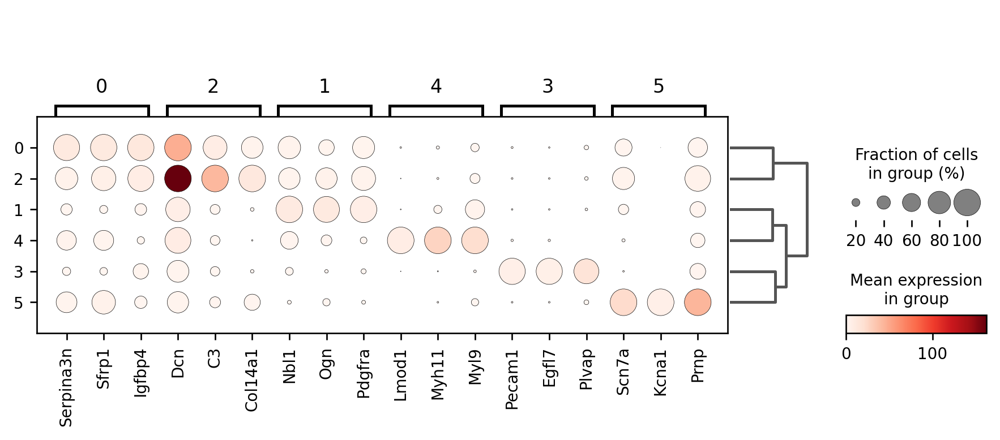

In [ ]:
sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(adata, n_genes=3, groupby='leiden');

### Overlay cNMF Gene Expression Programs (GEPs)

In [ ]:
# cNMF settings (modify as needed)
cNMF_k = 18
cNMF_density_thresh = 0.20
cNMF_local_neighborhood_size = 0.3

# Load cNMF usage matrix into AnnData
usage_path = '/content/cNMF-output/Shiv2022-cNMF/Shiv2022-cNMF.usages.k_18.dt_0_2.consensus.txt'
usage_matrix = pd.read_csv(usage_path, sep='\t', index_col=0)
usage_matrix.columns = ['GEP_%s' % i for i in usage_matrix.columns]
usage_matrix = usage_matrix.div(usage_matrix.sum(axis=1), axis=0)
for x in usage_matrix.columns:
  adata.obs[x] = usage_matrix[x].tolist()

In [ ]:
# Obtain the top z-scored genes for each GEP
n_top_genes = 2000

gene_scores_path = '/content/cNMF-output/Shiv2022-cNMF/Shiv2022-cNMF.spectra.k_18.dt_0_2.consensus.txt'
gene_scores = pd.read_csv(gene_scores_path, sep='\t', index_col=0).T

top_genes = []
for gep in gene_scores.columns:
    top_genes.append(list(gene_scores.sort_values(by=gep, ascending=False).index[:n_top_genes]))    
top_genes = pd.DataFrame(top_genes, index=usage_matrix.columns).T
top_genes.to_csv('sample3-WholeMes_Col_GEPtopgenes.csv')

pd.options.display.max_columns=None
pd.options.display.max_rows=30

top_genes

,GEP_1,GEP_2,GEP_3,GEP_4,GEP_5,GEP_6,GEP_7,GEP_8,GEP_9,GEP_10,GEP_11,GEP_12,GEP_13,GEP_14,GEP_15,GEP_16,GEP_17,GEP_18
0,Nbl1,Selp,Fth1,Mxd3,Lair1,Dcn,Plvap,Junb,Il1rl1,Prnp,Lmod1,Lyve1,Fos,Gbp2,Sema3g,Cd248,Mzb1,Rgs5
1,Ogn,Madcam1,Tmem176b,Cenpf,Slc38a1,Fmo2,Flt1,Egr1,Plau,Ank3,Acta2,Mmrn1,Jun,Ifi47,Clu,Fbn1,Ighg2b,Notch3
2,Tcf4,Ackr1,Tmem176a,Kif4,Itgax,Lum,Kdr,Mt1,Bmp2,Plp1,Tpm2,Reln,Hsp90aa1,Cxcl9,Stmn2,Fstl1,Igkc,Ndufa4l2
3,Pdgfra,Sele,Apoe,Hmmr,Itgam,Dpt,Emcn,Zfp36,Tgfbi,Scn7a,Actg2,Ccl21a,Fosb,Igtp,Fam107a,Mfap5,Ly6c2,Map3k7cl
4,Gnai1,Hdc,Igfbp4,Cep55,Cd300c2,Grem1,Adgrl4,Pim1,Lpar3,Kcna2,Cnn1,Flt4,Dusp1,Gbp7,Eps8l2,Gfpt2,Igha,Olfr558
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,Gm42047,Sv2b,Mamstr,Ttyh1,4931406P16Rik,Kcne3,Sox6,Cadm4,Itpkc,Il4i1,Nfkbid,Dgat2,Plaur,Tyrobp,Sv2b,Ceacam2,Ces1e,Ces1e
1996,Jph3,Gm44812,Rasip1,Lair1,Gm10640,Gm34280,Calcb,Bcam,Ceacam1,4933421I07Rik,Tyrobp,Thrsp,Apoc1,Ppp1r14a,Gm44812,Ceacam1,Penk,Ces1c
1997,Foxc2,Aldh1a3,Izumo1,2810474O19Rik,Lgi4,Gm26705,4933406I18Rik,Apoe,Cadm4,Gm10640,Gmfg,Gm44751,Exoc3l2,2200002D01Rik,Nr2f2,Lipe,Ces1c,Ces1b
1998,Gja5,Pcsk6,0610005C13Rik,Gm17216,Fxyd1,Dgat2,Spon1,Apoc1,Vmn1r181,Fam187b,Hipk4,Gm26522,Gpr4,Gmfg,Aldh1a3,Vmn1r181,Ces1b,Gm45472


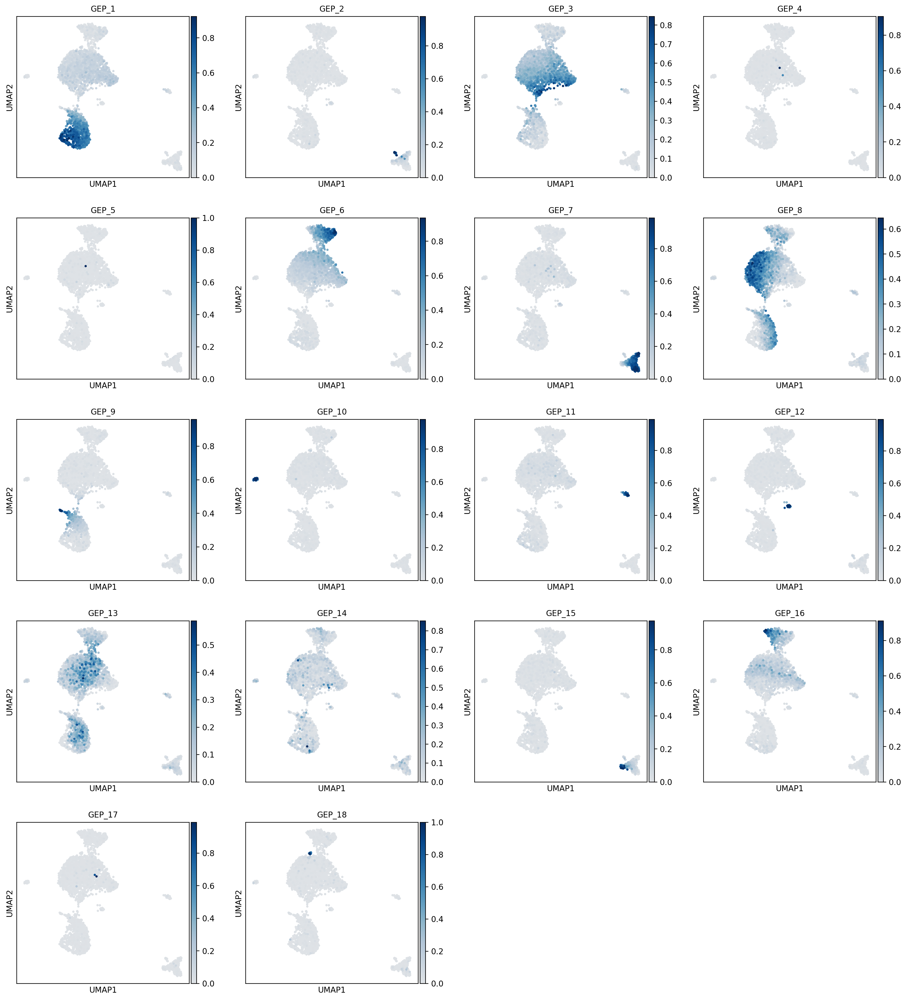

In [ ]:
# Plot the UMAP with GEP scores  
sc.pl.umap(adata, color=usage_matrix.columns, save='_'+sample_name_prefix+'.all.gep.pdf', cmap=dew.darken_cmap(plt.cm.Blues, 0.9))

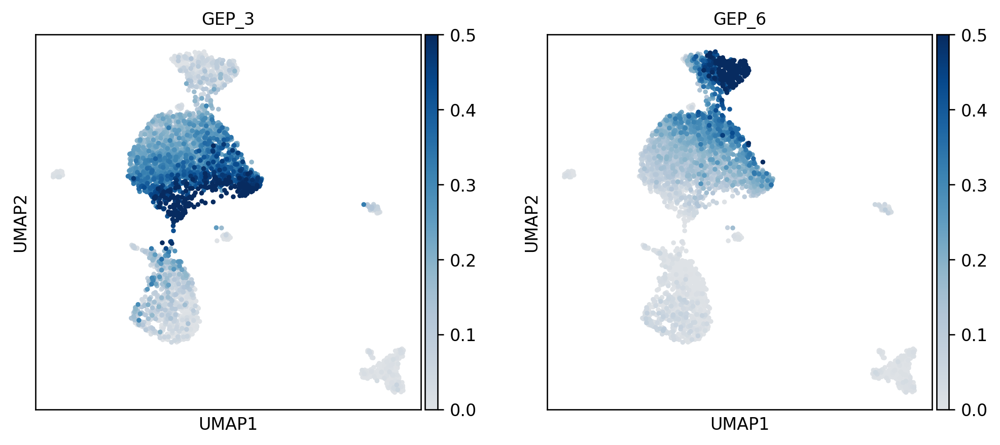

In [ ]:
# Plot the UMAP with GEP scores  
sc.pl.umap(adata, color=['GEP_3','GEP_6'], save='_'+sample_name_prefix+'.gep6+3.pdf', cmap=dew.darken_cmap(plt.cm.Blues, 0.9), vmin=0, vmax=0.5)


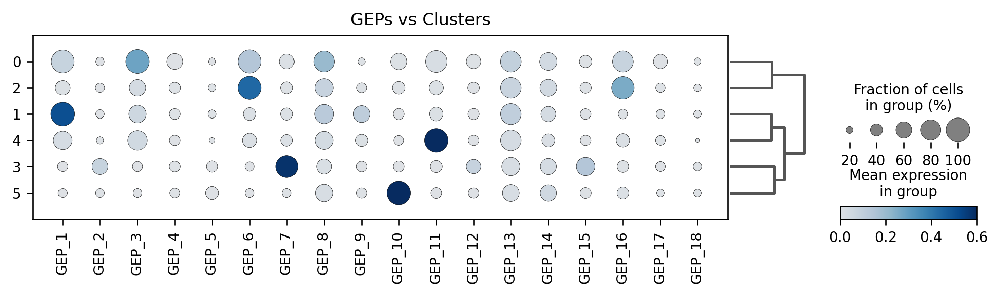

In [ ]:
# Confirm GEP specificity with dot plots
sc.pl.dotplot(adata, usage_matrix.columns, groupby='leiden', dendrogram=True, layer='raw', 
              title='GEPs vs Clusters', figsize=[10,2],
              save=sample_name_prefix+'.gep-vs-leiden-dotplot.pdf', cmap=dew.darken_cmap(plt.cm.Blues, 0.9), vmin=0, vmax=0.6)

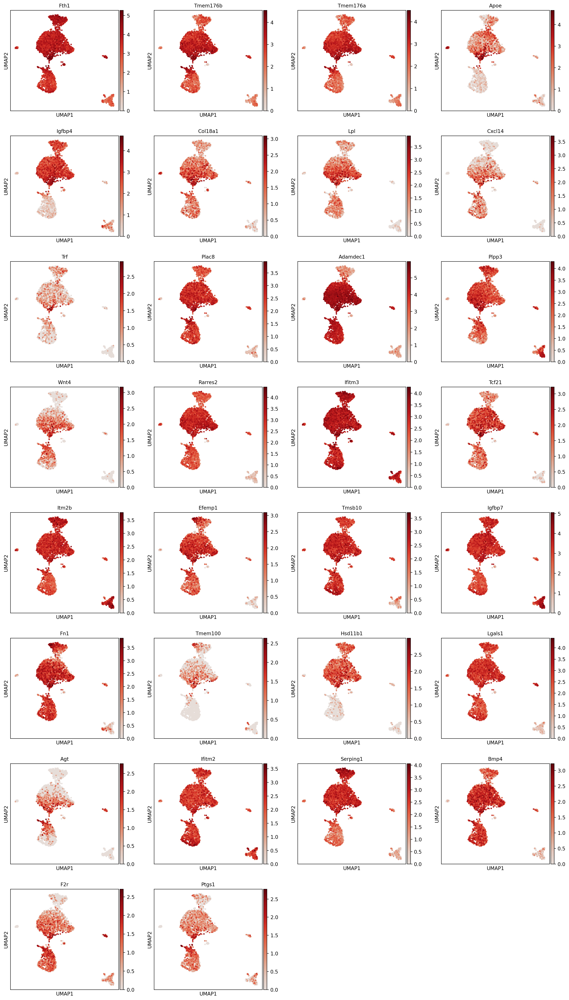

In [ ]:
# Overlay the top 30 genes from GEP3 (Wnt4 is ranked #13) 
sc.pl.umap(adata, color=top_genes['GEP_3'][0:30].tolist(), ncols=4, layer='raw', save='_'+sample_name_prefix+'.gep3.30genes.pdf', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))

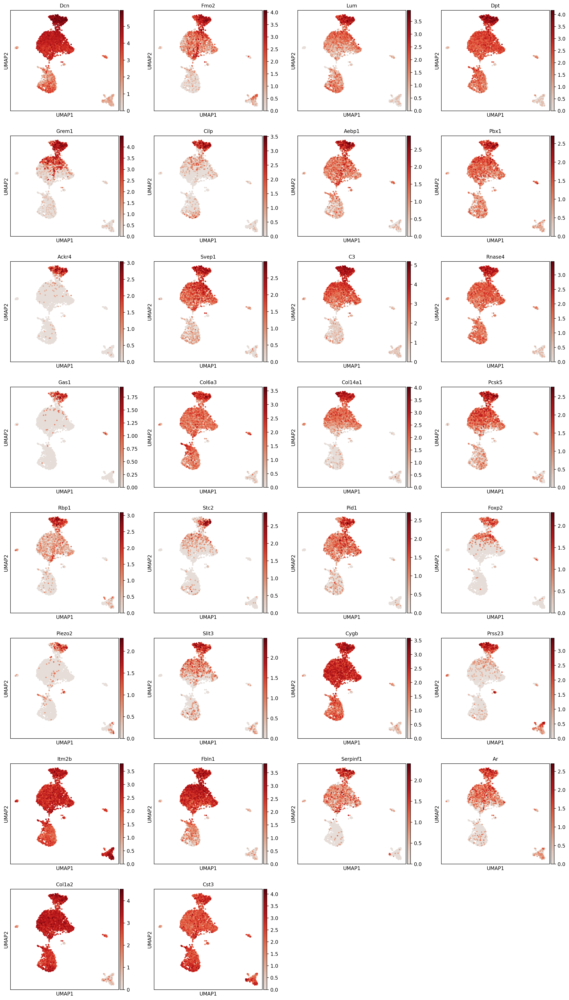

In [ ]:
# Overlay the top 30 genes from GEP6 (Grem1 is ranked #5) 
sc.pl.umap(adata, color=top_genes['GEP_6'][0:30].tolist(), ncols=4, layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9), save='_'+sample_name_prefix+'.gep6.30genes.pdf')

### Plot GEPs VS Pseudotime


In [ ]:
# subset the continuum of cell states encompassing leiden clusters 0 & 1
flag = np.in1d(adata.obs['leiden'],['0','2'])
adata_sub = adata[flag,:]

In [ ]:
#sc.tl.leiden(adata_sub, resolution=2, key_added='leiden2') # default resolution = 1
#sc.pl.umap(adata_sub, color =['leiden'])

In [ ]:
# select a root cell at random from leiden cluster 1
adata_sub.uns['iroot'] = np.flatnonzero(adata_sub.obs['leiden'] == '2')[1]

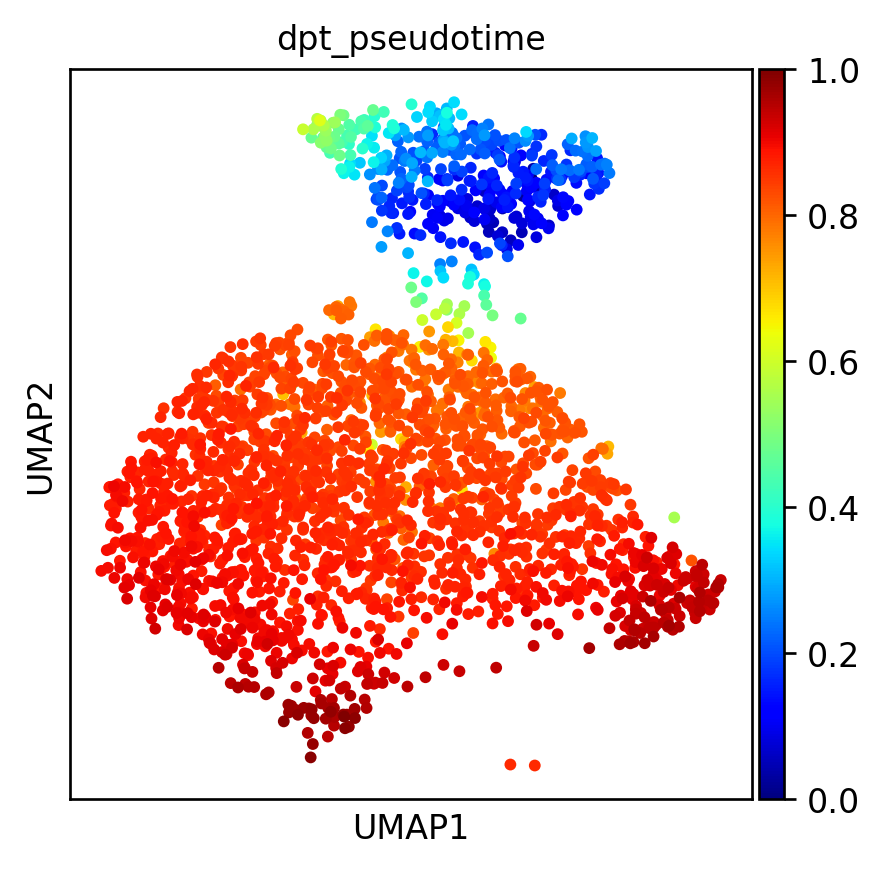

In [ ]:
# compute & plot pseudotime values
sc.tl.diffmap(adata_sub)
sc.tl.dpt(adata_sub)
sc.pl.umap(adata_sub, color =['dpt_pseudotime'], cmap='jet', save='_'+sample_name_prefix+'.pseudotime.pdf')

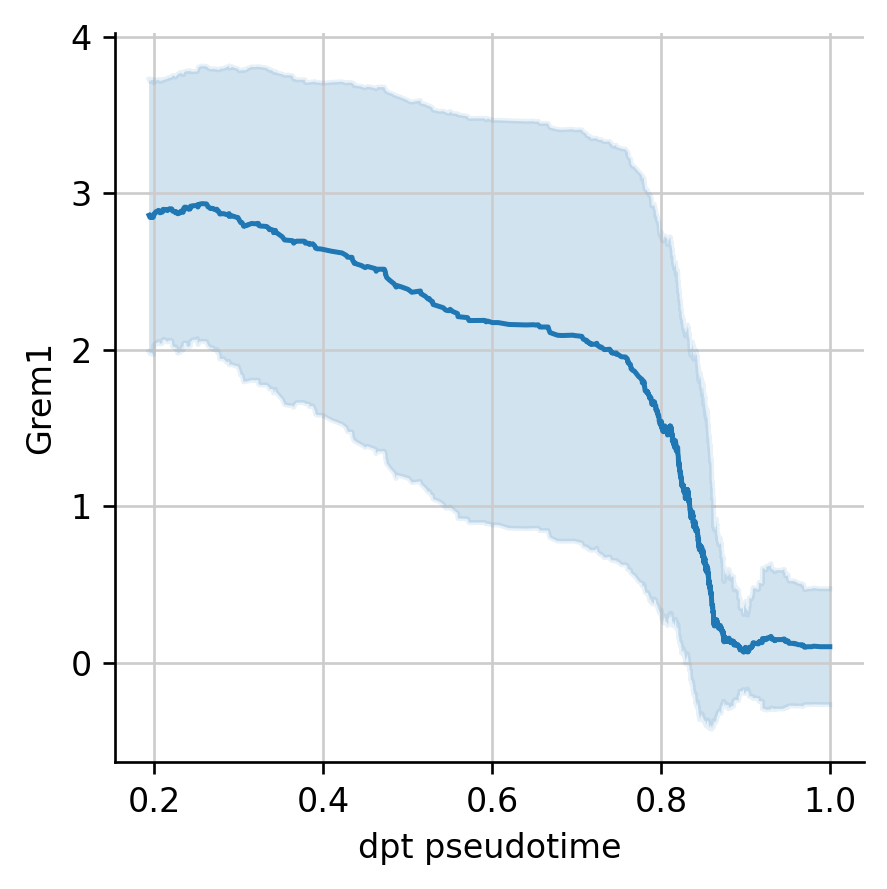

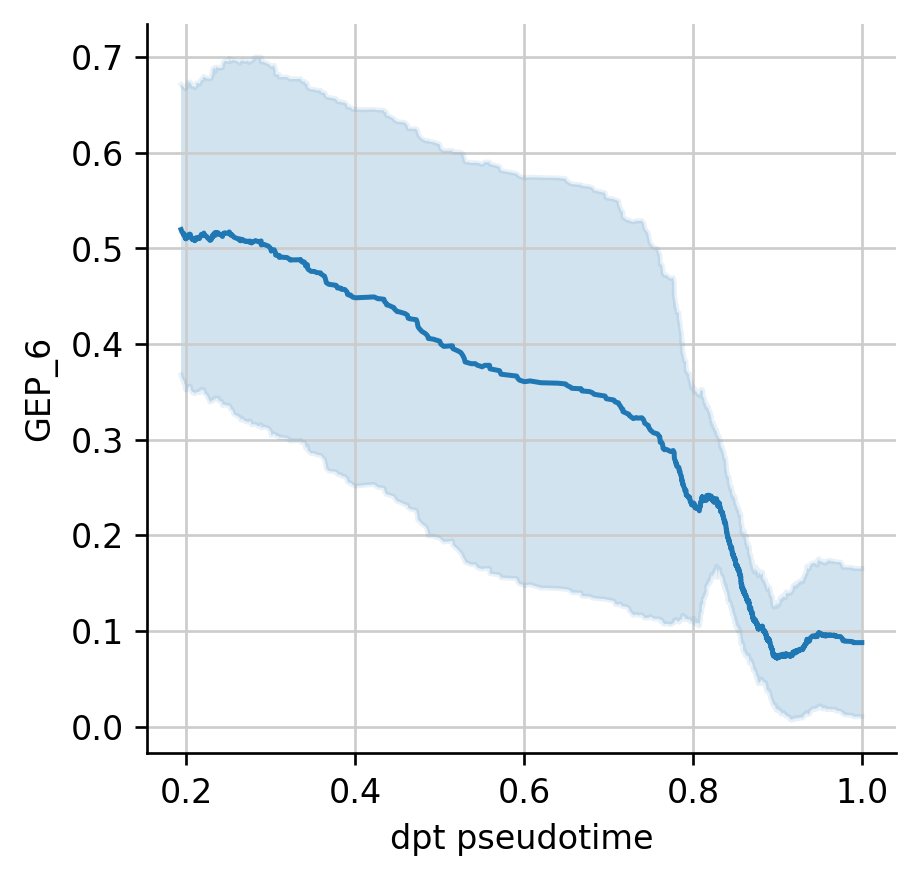

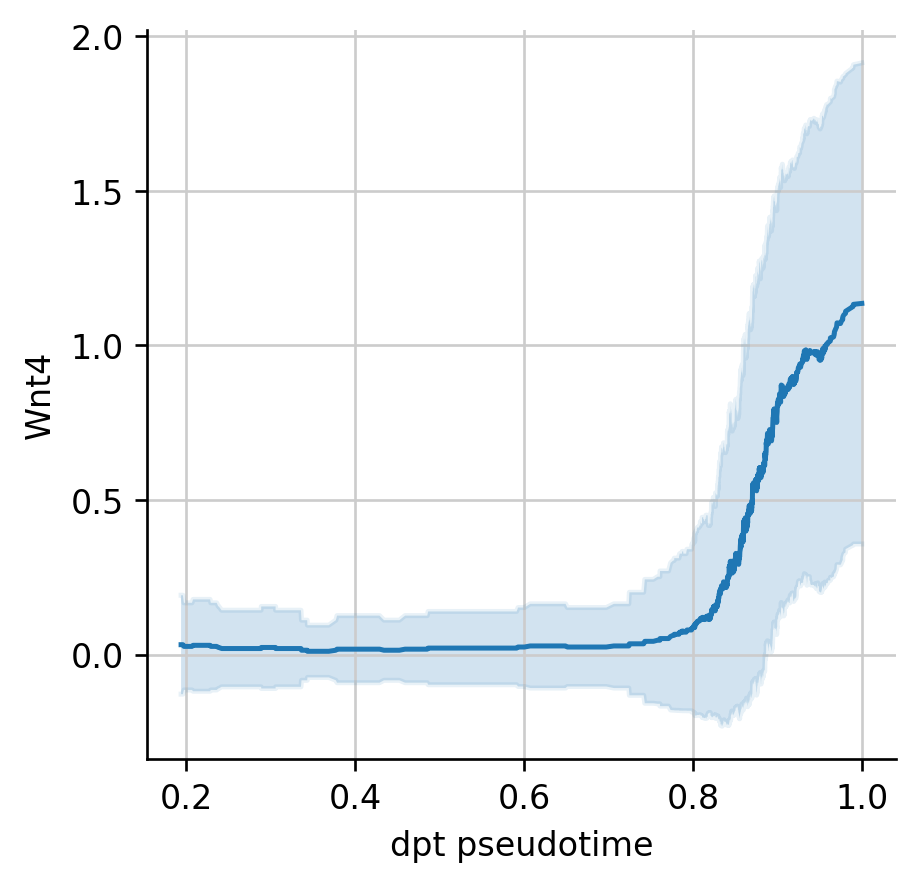

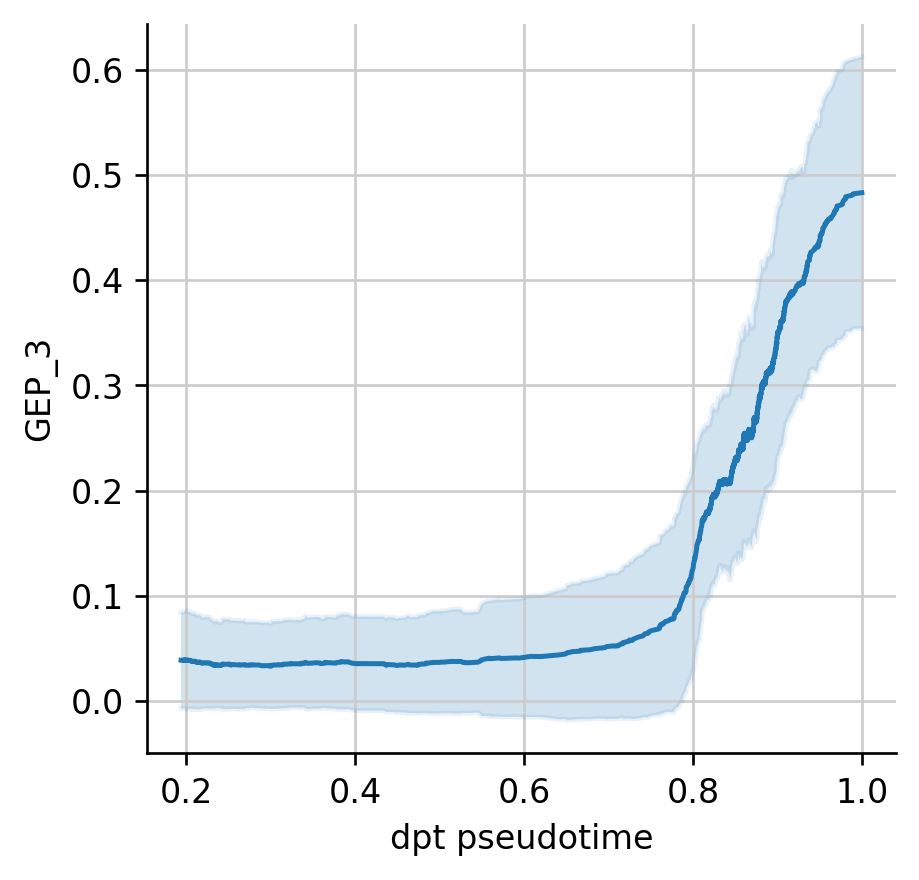

In [ ]:
# plot the pseudotime trajectories for genes & GEPs
dew.plot_dpt_trajectory(adata_sub, 'Grem1', sliding_window=200, save='_'+sample_name_prefix+'.Grem1.pdf')
dew.plot_dpt_trajectory(adata_sub, 'GEP_6', sliding_window=200, save='_'+sample_name_prefix+'.gep6.pdf')

dew.plot_dpt_trajectory(adata_sub, 'Wnt4', sliding_window=200, save='_'+sample_name_prefix+'.Wnt4.pdf')
dew.plot_dpt_trajectory(adata_sub, 'GEP_3', sliding_window=200, save='_'+sample_name_prefix+'.gep3.pdf')
